# Motion Tutorial from waymo-open-dataset repo

https://github.com/waymo-research/waymo-open-dataset/blob/master/tutorial/tutorial_motion.ipynb

In [9]:
import math
import os
import uuid
import time

from matplotlib import cm
import matplotlib.animation as animation
import matplotlib.pyplot as plt

import numpy as np
from IPython.display import HTML
import itertools
import tensorflow as tf

from waymo_open_dataset.metrics.ops import py_metrics_ops
from waymo_open_dataset.metrics.python import config_util_py as config_util
from waymo_open_dataset.protos import motion_metrics_pb2, scenario_pb2


# If you use a custom conversion from Scenario to tf.Example, set the correct
# number of map samples here.
num_map_samples = 30000

# Example field definition
roadgraph_features = {
    'roadgraph_samples/dir': tf.io.FixedLenFeature(
        [num_map_samples, 3], tf.float32, default_value=None
    ),
    'roadgraph_samples/id': tf.io.FixedLenFeature(
        [num_map_samples, 1], tf.int64, default_value=None
    ),
    'roadgraph_samples/type': tf.io.FixedLenFeature(
        [num_map_samples, 1], tf.int64, default_value=None
    ),
    'roadgraph_samples/valid': tf.io.FixedLenFeature(
        [num_map_samples, 1], tf.int64, default_value=None
    ),
    'roadgraph_samples/xyz': tf.io.FixedLenFeature(
        [num_map_samples, 3], tf.float32, default_value=None
    ),
}
# Features of other agents.
state_features = {
    'state/id':
        tf.io.FixedLenFeature([128], tf.float32, default_value=None),
    'state/type':
        tf.io.FixedLenFeature([128], tf.float32, default_value=None),
    'state/is_sdc':
        tf.io.FixedLenFeature([128], tf.int64, default_value=None),
    'state/tracks_to_predict':
        tf.io.FixedLenFeature([128], tf.int64, default_value=None),
    'state/current/bbox_yaw':
        tf.io.FixedLenFeature([128, 1], tf.float32, default_value=None),
    'state/current/height':
        tf.io.FixedLenFeature([128, 1], tf.float32, default_value=None),
    'state/current/length':
        tf.io.FixedLenFeature([128, 1], tf.float32, default_value=None),
    'state/current/timestamp_micros':
        tf.io.FixedLenFeature([128, 1], tf.int64, default_value=None),
    'state/current/valid':
        tf.io.FixedLenFeature([128, 1], tf.int64, default_value=None),
    'state/current/vel_yaw':
        tf.io.FixedLenFeature([128, 1], tf.float32, default_value=None),
    'state/current/velocity_x':
        tf.io.FixedLenFeature([128, 1], tf.float32, default_value=None),
    'state/current/velocity_y':
        tf.io.FixedLenFeature([128, 1], tf.float32, default_value=None),
    'state/current/width':
        tf.io.FixedLenFeature([128, 1], tf.float32, default_value=None),
    'state/current/x':
        tf.io.FixedLenFeature([128, 1], tf.float32, default_value=None),
    'state/current/y':
        tf.io.FixedLenFeature([128, 1], tf.float32, default_value=None),
    'state/current/z':
        tf.io.FixedLenFeature([128, 1], tf.float32, default_value=None),
    'state/future/bbox_yaw':
        tf.io.FixedLenFeature([128, 80], tf.float32, default_value=None),
    'state/future/height':
        tf.io.FixedLenFeature([128, 80], tf.float32, default_value=None),
    'state/future/length':
        tf.io.FixedLenFeature([128, 80], tf.float32, default_value=None),
    'state/future/timestamp_micros':
        tf.io.FixedLenFeature([128, 80], tf.int64, default_value=None),
    'state/future/valid':
        tf.io.FixedLenFeature([128, 80], tf.int64, default_value=None),
    'state/future/vel_yaw':
        tf.io.FixedLenFeature([128, 80], tf.float32, default_value=None),
    'state/future/velocity_x':
        tf.io.FixedLenFeature([128, 80], tf.float32, default_value=None),
    'state/future/velocity_y':
        tf.io.FixedLenFeature([128, 80], tf.float32, default_value=None),
    'state/future/width':
        tf.io.FixedLenFeature([128, 80], tf.float32, default_value=None),
    'state/future/x':
        tf.io.FixedLenFeature([128, 80], tf.float32, default_value=None),
    'state/future/y':
        tf.io.FixedLenFeature([128, 80], tf.float32, default_value=None),
    'state/future/z':
        tf.io.FixedLenFeature([128, 80], tf.float32, default_value=None),
    'state/past/bbox_yaw':
        tf.io.FixedLenFeature([128, 10], tf.float32, default_value=None),
    'state/past/height':
        tf.io.FixedLenFeature([128, 10], tf.float32, default_value=None),
    'state/past/length':
        tf.io.FixedLenFeature([128, 10], tf.float32, default_value=None),
    'state/past/timestamp_micros':
        tf.io.FixedLenFeature([128, 10], tf.int64, default_value=None),
    'state/past/valid':
        tf.io.FixedLenFeature([128, 10], tf.int64, default_value=None),
    'state/past/vel_yaw':
        tf.io.FixedLenFeature([128, 10], tf.float32, default_value=None),
    'state/past/velocity_x':
        tf.io.FixedLenFeature([128, 10], tf.float32, default_value=None),
    'state/past/velocity_y':
        tf.io.FixedLenFeature([128, 10], tf.float32, default_value=None),
    'state/past/width':
        tf.io.FixedLenFeature([128, 10], tf.float32, default_value=None),
    'state/past/x':
        tf.io.FixedLenFeature([128, 10], tf.float32, default_value=None),
    'state/past/y':
        tf.io.FixedLenFeature([128, 10], tf.float32, default_value=None),
    'state/past/z':
        tf.io.FixedLenFeature([128, 10], tf.float32, default_value=None),
}

traffic_light_features = {
    'traffic_light_state/current/state':
        tf.io.FixedLenFeature([1, 16], tf.int64, default_value=None),
    'traffic_light_state/current/valid':
        tf.io.FixedLenFeature([1, 16], tf.int64, default_value=None),
    'traffic_light_state/current/x':
        tf.io.FixedLenFeature([1, 16], tf.float32, default_value=None),
    'traffic_light_state/current/y':
        tf.io.FixedLenFeature([1, 16], tf.float32, default_value=None),
    'traffic_light_state/current/z':
        tf.io.FixedLenFeature([1, 16], tf.float32, default_value=None),
    'traffic_light_state/past/state':
        tf.io.FixedLenFeature([10, 16], tf.int64, default_value=None),
    'traffic_light_state/past/valid':
        tf.io.FixedLenFeature([10, 16], tf.int64, default_value=None),
    'traffic_light_state/past/x':
        tf.io.FixedLenFeature([10, 16], tf.float32, default_value=None),
    'traffic_light_state/past/y':
        tf.io.FixedLenFeature([10, 16], tf.float32, default_value=None),
    'traffic_light_state/past/z':
        tf.io.FixedLenFeature([10, 16], tf.float32, default_value=None),
}

features_description = {}
features_description.update(roadgraph_features)
features_description.update(state_features)
features_description.update(traffic_light_features)

In [2]:
FILENAME = '/data/cmpe258-sp24/017553289/cmpe249/Project2/MTR/data/waymo/scenario/training/training.tfrecord-00000-of-01000'

In [11]:
dataset = tf.data.TFRecordDataset(FILENAME, compression_type='')
# data = next(dataset.as_numpy_iterator())
# parsed = tf.io.parse_single_example(data, features_description)

scenario_data = []
for data in dataset:
     proto_string = data.numpy()
     proto = scenario_pb2.Scenario()
     proto.ParseFromString(proto_string)
     scenario_data.append(proto)

2024-11-23 18:09:01.268242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1]
	 [[{{node Placeholder/_0}}]]


In [20]:
sample = scenario_data[0]

timestamps_seconds: 0.0
timestamps_seconds: 0.10002
timestamps_seconds: 0.2
timestamps_seconds: 0.29995
timestamps_seconds: 0.39994
timestamps_seconds: 0.49992
timestamps_seconds: 0.59994
timestamps_seconds: 0.6999
timestamps_seconds: 0.79992
timestamps_seconds: 0.89991
timestamps_seconds: 0.99989
timestamps_seconds: 1.09992
timestamps_seconds: 1.19991
timestamps_seconds: 1.29994
timestamps_seconds: 1.39995
timestamps_seconds: 1.49994
timestamps_seconds: 1.59996
timestamps_seconds: 1.69999
timestamps_seconds: 1.80001
timestamps_seconds: 1.90004
timestamps_seconds: 2.00006
timestamps_seconds: 2.10009
timestamps_seconds: 2.20011
timestamps_seconds: 2.30009
timestamps_seconds: 2.40012
timestamps_seconds: 2.5001
timestamps_seconds: 2.60013
timestamps_seconds: 2.70011
timestamps_seconds: 2.8001
timestamps_seconds: 2.90005
timestamps_seconds: 3.00004
timestamps_seconds: 3.10003
timestamps_seconds: 3.20001
timestamps_seconds: 3.29999
timestamps_seconds: 3.40001
timestamps_seconds: 3.5
timesta

In [17]:
def create_figure_and_axes(size_pixels):
  """Initializes a unique figure and axes for plotting."""
  fig, ax = plt.subplots(1, 1, num=uuid.uuid4())

  # Sets output image to pixel resolution.
  dpi = 100
  size_inches = size_pixels / dpi
  fig.set_size_inches([size_inches, size_inches])
  fig.set_dpi(dpi)
  fig.set_facecolor('white')
  ax.set_facecolor('white')
  ax.xaxis.label.set_color('black')
  ax.tick_params(axis='x', colors='black')
  ax.yaxis.label.set_color('black')
  ax.tick_params(axis='y', colors='black')
  fig.set_tight_layout(True)
  ax.grid(False)
  return fig, ax


def fig_canvas_image(fig):
  """Returns a [H, W, 3] uint8 np.array image from fig.canvas.tostring_rgb()."""
  # Just enough margin in the figure to display xticks and yticks.
  fig.subplots_adjust(
      left=0.08, bottom=0.08, right=0.98, top=0.98, wspace=0.0, hspace=0.0)
  fig.canvas.draw()
  data = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
  return data.reshape(fig.canvas.get_width_height()[::-1] + (3,))


def get_colormap(num_agents):
  """Compute a color map array of shape [num_agents, 4]."""
  colors = cm.get_cmap('jet', num_agents)
  colors = colors(range(num_agents))
  np.random.shuffle(colors)
  return colors


def get_viewport(all_states, all_states_mask):
  """Gets the region containing the data.

  Args:
    all_states: states of agents as an array of shape [num_agents, num_steps,
      2].
    all_states_mask: binary mask of shape [num_agents, num_steps] for
      `all_states`.

  Returns:
    center_y: float. y coordinate for center of data.
    center_x: float. x coordinate for center of data.
    width: float. Width of data.
  """
  valid_states = all_states[all_states_mask]
  all_y = valid_states[..., 1]
  all_x = valid_states[..., 0]

  center_y = (np.max(all_y) + np.min(all_y)) / 2
  center_x = (np.max(all_x) + np.min(all_x)) / 2

  range_y = np.ptp(all_y)
  range_x = np.ptp(all_x)

  width = max(range_y, range_x)

  return center_y, center_x, width


def visualize_one_step(states,
                       mask,
                       roadgraph,
                       title,
                       center_y,
                       center_x,
                       width,
                       color_map,
                       size_pixels=1000):
  """Generate visualization for a single step."""

  # Create figure and axes.
  fig, ax = create_figure_and_axes(size_pixels=size_pixels)

  # Plot roadgraph.
  rg_pts = roadgraph[:, :2].T
  ax.plot(rg_pts[0, :], rg_pts[1, :], 'k.', alpha=1, ms=2)

  masked_x = states[:, 0][mask]
  masked_y = states[:, 1][mask]
  colors = color_map[mask]

  # Plot agent current position.
  ax.scatter(
      masked_x,
      masked_y,
      marker='o',
      linewidths=3,
      color=colors,
  )

  # Title.
  ax.set_title(title)

  # Set axes.  Should be at least 10m on a side and cover 160% of agents.
  size = max(10, width * 1.0)
  ax.axis([
      -size / 2 + center_x, size / 2 + center_x, -size / 2 + center_y,
      size / 2 + center_y
  ])
  ax.set_aspect('equal')

  image = fig_canvas_image(fig)
  plt.close(fig)
  return image


def visualize_all_agents_smooth(
    decoded_example,
    size_pixels=1000,
):
  """Visualizes all agent predicted trajectories in a serie of images.

  Args:
    decoded_example: Dictionary containing agent info about all modeled agents.
    size_pixels: The size in pixels of the output image.

  Returns:
    T of [H, W, 3] uint8 np.arrays of the drawn matplotlib's figure canvas.
  """
  # [num_agents, num_past_steps, 2] float32.
  past_states = tf.stack(
      [decoded_example['state/past/x'], decoded_example['state/past/y']],
      -1).numpy()
  past_states_mask = decoded_example['state/past/valid'].numpy() > 0.0

  # [num_agents, 1, 2] float32.
  current_states = tf.stack(
      [decoded_example['state/current/x'], decoded_example['state/current/y']],
      -1).numpy()
  current_states_mask = decoded_example['state/current/valid'].numpy() > 0.0

  # [num_agents, num_future_steps, 2] float32.
  future_states = tf.stack(
      [decoded_example['state/future/x'], decoded_example['state/future/y']],
      -1).numpy()
  future_states_mask = decoded_example['state/future/valid'].numpy() > 0.0

  # [num_points, 3] float32.
  roadgraph_xyz = decoded_example['roadgraph_samples/xyz'].numpy()

  num_agents, num_past_steps, _ = past_states.shape
  num_future_steps = future_states.shape[1]

  color_map = get_colormap(num_agents)

  # [num_agens, num_past_steps + 1 + num_future_steps, depth] float32.
  all_states = np.concatenate([past_states, current_states, future_states], 1)

  # [num_agens, num_past_steps + 1 + num_future_steps] float32.
  all_states_mask = np.concatenate(
      [past_states_mask, current_states_mask, future_states_mask], 1)

  center_y, center_x, width = get_viewport(all_states, all_states_mask)

  images = []

  # Generate images from past time steps.
  for i, (s, m) in enumerate(
      zip(
          np.split(past_states, num_past_steps, 1),
          np.split(past_states_mask, num_past_steps, 1))):
    im = visualize_one_step(s[:, 0], m[:, 0], roadgraph_xyz,
                            'past: %d' % (num_past_steps - i), center_y,
                            center_x, width, color_map, size_pixels)
    images.append(im)

  # Generate one image for the current time step.
  s = current_states
  m = current_states_mask

  im = visualize_one_step(s[:, 0], m[:, 0], roadgraph_xyz, 'current', center_y,
                          center_x, width, color_map, size_pixels)
  images.append(im)

  # Generate images from future time steps.
  for i, (s, m) in enumerate(
      zip(
          np.split(future_states, num_future_steps, 1),
          np.split(future_states_mask, num_future_steps, 1))):
    im = visualize_one_step(s[:, 0], m[:, 0], roadgraph_xyz,
                            'future: %d' % (i + 1), center_y, center_x, width,
                            color_map, size_pixels)
    images.append(im)

  return images


images = visualize_all_agents_smooth(scenario_data[0])

TypeError: 'Scenario' object is not subscriptable

# Visualizing MTR preprocessed dataset

In [1]:
import joblib
import glob
from mtr.datasets.waymo.waymo_types import object_type, lane_type, road_line_type, road_edge_type, signal_state, polyline_type

In [2]:
files = glob.glob('/data/cmpe258-sp24/017553289/cmpe249/Project2/MTR/data/waymo/processed_scenarios_training/*')
len(files)

486995

In [3]:
data = joblib.load(files[0])

In [4]:
# Extract track information
track_infos = data['track_infos']
object_ids = track_infos['object_id']
object_types = track_infos['object_type']
trajs = track_infos['trajs']  # Shape: (num_objects, num_timestamps, 10)

# Extract map information
map_infos = data['map_infos']
polylines = map_infos['all_polylines']  # Shape: (num_points, 7)

# Extract dynamic map information if needed
dynamic_map_infos = data['dynamic_map_infos']

# Timestamps
timestamps = data['timestamps_seconds']

In [5]:
polyline_type
polyline_label_mapping = {v:k for k,v in polyline_type.items()}

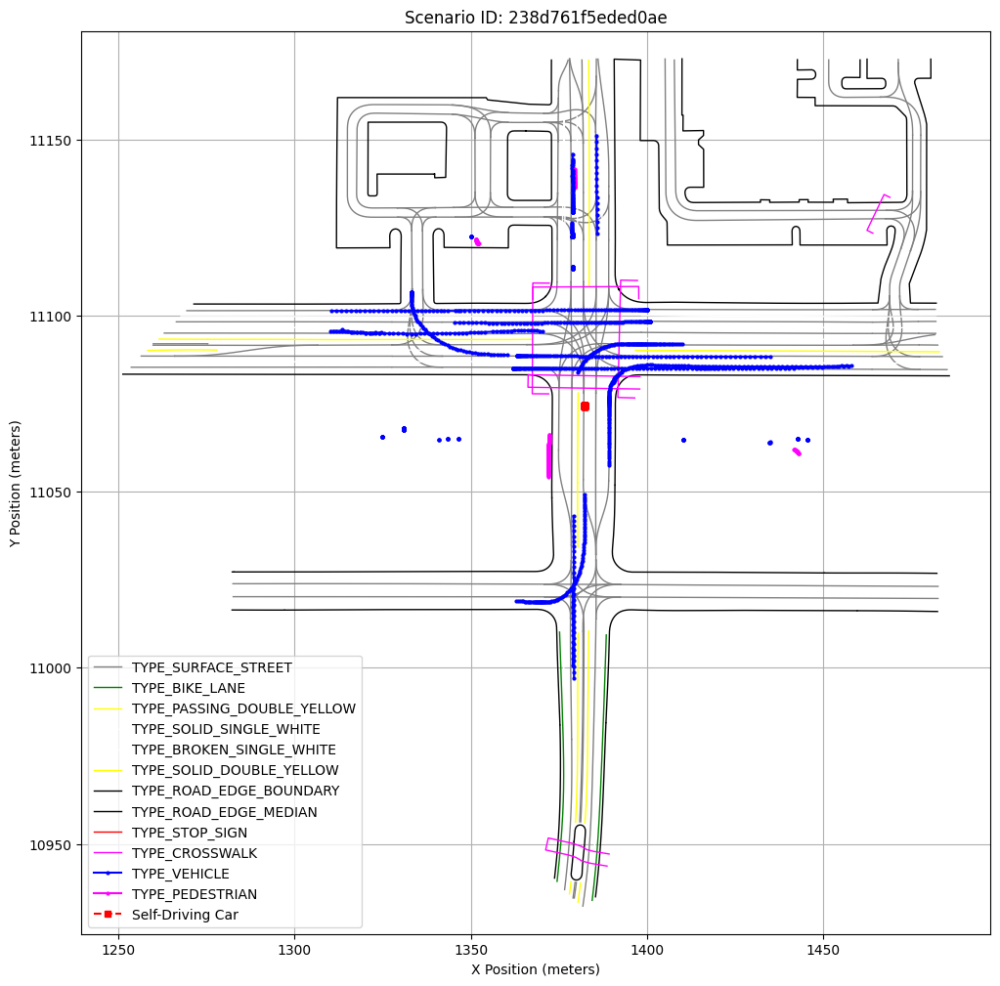

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 12))
plt.title(f"Scenario ID: {data['scenario_id']}")
plt.xlabel('X Position (meters)')
plt.ylabel('Y Position (meters)')

# Define colors for different polyline types
polyline_type_colors = {
    -1: 'lightgreen',  # Undefined
    1: 'lightblue',  # Freeway
    2: 'gray',  # Surface street
    3: 'green',  # Bike lane
    6: 'white',  # Broken single white
    7: 'white',  # Solid single white
    8: 'white',  # Solid double white
    9: 'yellow',  # Broken single yellow
    10: 'yellow',  # Broken double yellow
    11: 'yellow',  # Solid single yellow
    12: 'yellow',  # Solid double yellow
    13: 'yellow',  # Passing double yellow
    15: 'black',  # Road edge boundary
    16: 'black',  # Road edge median
    17: 'red',  # Stop sign
    18: 'magenta',  # Crosswalk
    19: 'brown',  # Speed bump
}

# Plot polylines
for feature_type, features in map_infos.items():
    if feature_type == 'all_polylines':
        continue  # Skip the combined polylines
    for feature in features:
        start_idx, end_idx = feature['polyline_index']
        polyline = polylines[start_idx:end_idx]
        polyline_type_id = int(polyline[0, -1])
        color = polyline_type_colors.get(polyline_type_id, 'lightgreen')
        plt.plot(polyline[:, 0], polyline[:, 1],label=polyline_label_mapping[polyline_type_id] if polyline_label_mapping[polyline_type_id] not in plt.gca().get_legend_handles_labels()[1] else "",
                 color=color,
                 linewidth=1)

num_objects = trajs.shape[0]

# Define colors for different object types
object_type_colors = {
    'TYPE_VEHICLE': 'blue',
    'TYPE_PEDESTRIAN': 'magenta',
    'TYPE_CYCLIST': 'cyan',
    'TYPE_OTHER': 'brown',
    'TYPE_UNSET': 'black'
}

for obj_idx in range(num_objects):
    object_id = object_ids[obj_idx]
    object_type_name = object_types[obj_idx]
    traj = trajs[obj_idx]  # Shape: (num_timestamps, 10)
    valid = traj[:, 9].astype(bool)  # The last column is 'valid'
    traj = traj[valid]  # Filter out invalid timestamps

    # Plot the trajectory
    plt.plot(traj[:, 0], traj[:, 1],
             marker='o',
             markersize=2,
             linestyle='-',
             color=object_type_colors.get(object_type_name, 'black'),
             label=object_type_name if object_type_name not in plt.gca().get_legend_handles_labels()[1] else "")


sdc_index = data['sdc_track_index']
sdc_traj = trajs[sdc_index]
valid = sdc_traj[:, 9].astype(bool)
sdc_traj = sdc_traj[valid]

plt.plot(sdc_traj[:, 0], sdc_traj[:, 1],
         marker='s',
         markersize=4,
         linestyle='--',
         color='red',
         label='Self-Driving Car')

plt.legend()
plt.axis('equal')  # Ensure the x and y axes have the same scale
plt.grid(True)
plt.show()

### Animation

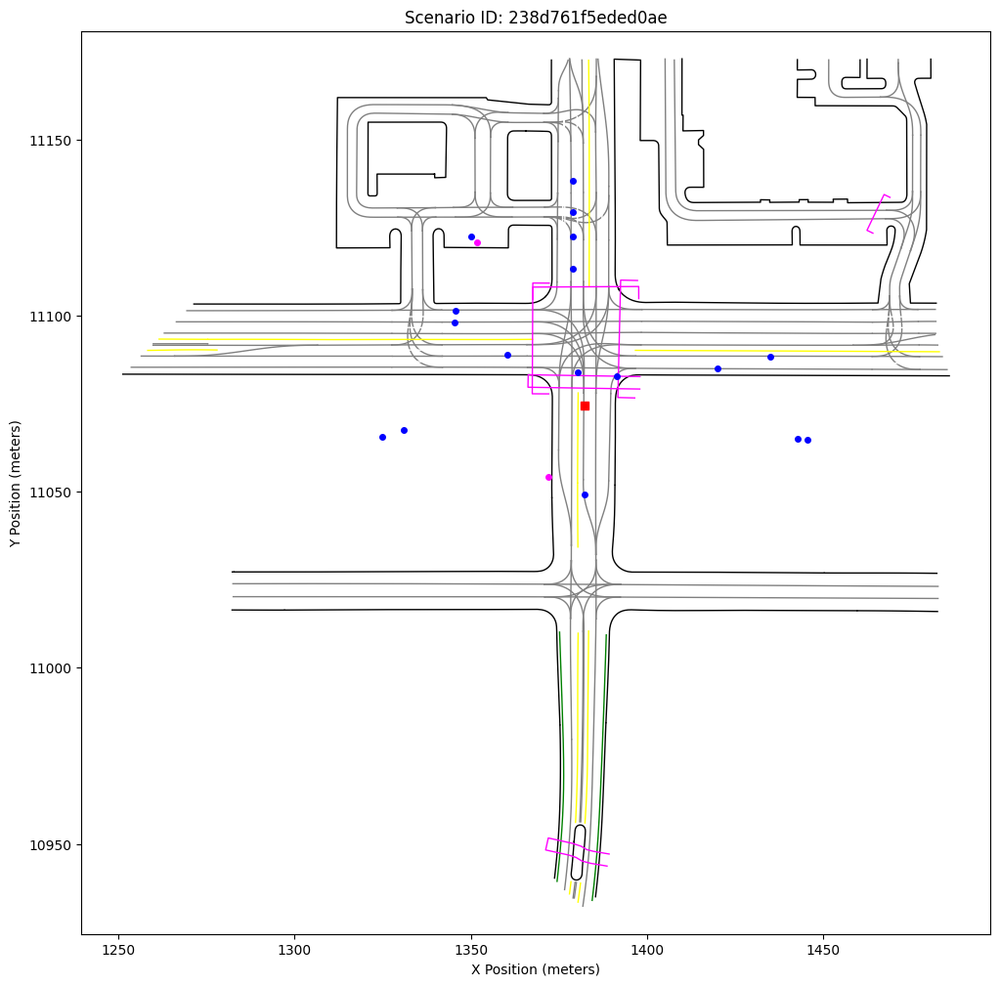

In [9]:
import matplotlib.animation as animation
fig, ax = plt.subplots(figsize=(12, 12))
ax.set_title(f"Scenario ID: {data['scenario_id']}")
ax.set_xlabel('X Position (meters)')
ax.set_ylabel('Y Position (meters)')
ax.set_xlim(-100, 100)  # Adjust limits as needed
ax.set_ylim(-100, 100)
ax.axis('equal')

# Plot map features (static map features)
for feature_type, features in map_infos.items():
    if feature_type == 'all_polylines':
        continue  # Skip the combined polylines
    for feature in features:
        start_idx, end_idx = feature['polyline_index']
        polyline = polylines[start_idx:end_idx]
        polyline_type_id = int(polyline[0, -1])
        color = polyline_type_colors.get(polyline_type_id, 'gray')
        ax.plot(polyline[:, 0], polyline[:, 1],
                color=color,
                linewidth=1)


from matplotlib.lines import Line2D

# Initialize lines for each object
lines = []
num_objects = trajs.shape[0]

for obj_idx in range(num_objects):
    object_type_name = object_types[obj_idx]
    color = object_type_colors.get(object_type_name, 'black')
    line, = ax.plot([], [], marker='o', markersize=4, linestyle='-', color=color)
    lines.append(line)

# Line for the SDC
sdc_line, = ax.plot([], [], marker='s', markersize=6, linestyle='--', color='red')

def init():
    for line in lines:
        line.set_data([], [])
    sdc_line.set_data([], [])
    return lines + [sdc_line]

def animate(frame):
    # Update each object's position at the current frame
    for obj_idx, line in enumerate(lines):
        traj = trajs[obj_idx]
        valid = traj[:, 9].astype(bool)
        if frame < len(traj) and valid[frame]:
            x = traj[frame, 0]
            y = traj[frame, 1]
            line.set_data([x], [y])
        else:
            line.set_data([], [])
    # Update SDC position
    sdc_traj = trajs[sdc_index]
    valid = sdc_traj[:, 9].astype(bool)
    if frame < len(sdc_traj) and valid[frame]:
        x = sdc_traj[frame, 0]
        y = sdc_traj[frame, 1]
        sdc_line.set_data([x], [y])
    else:
        sdc_line.set_data([], [])
    return lines + [sdc_line]


num_frames = trajs.shape[1]  # Number of timestamps

ani = animation.FuncAnimation(fig, animate, frames=num_frames,
                              init_func=init, blit=True, interval=100)

# To display the animation in a Jupyter Notebook
from IPython.display import HTML
# HTML(ani.to_jshtml())
HTML(ani.to_html5_video())

# Or to save the animation as an MP4 file
# ani.save('scenario_animation.mp4', writer='ffmpeg', codec='libx264', fps=10)

### Simple Version Visualization

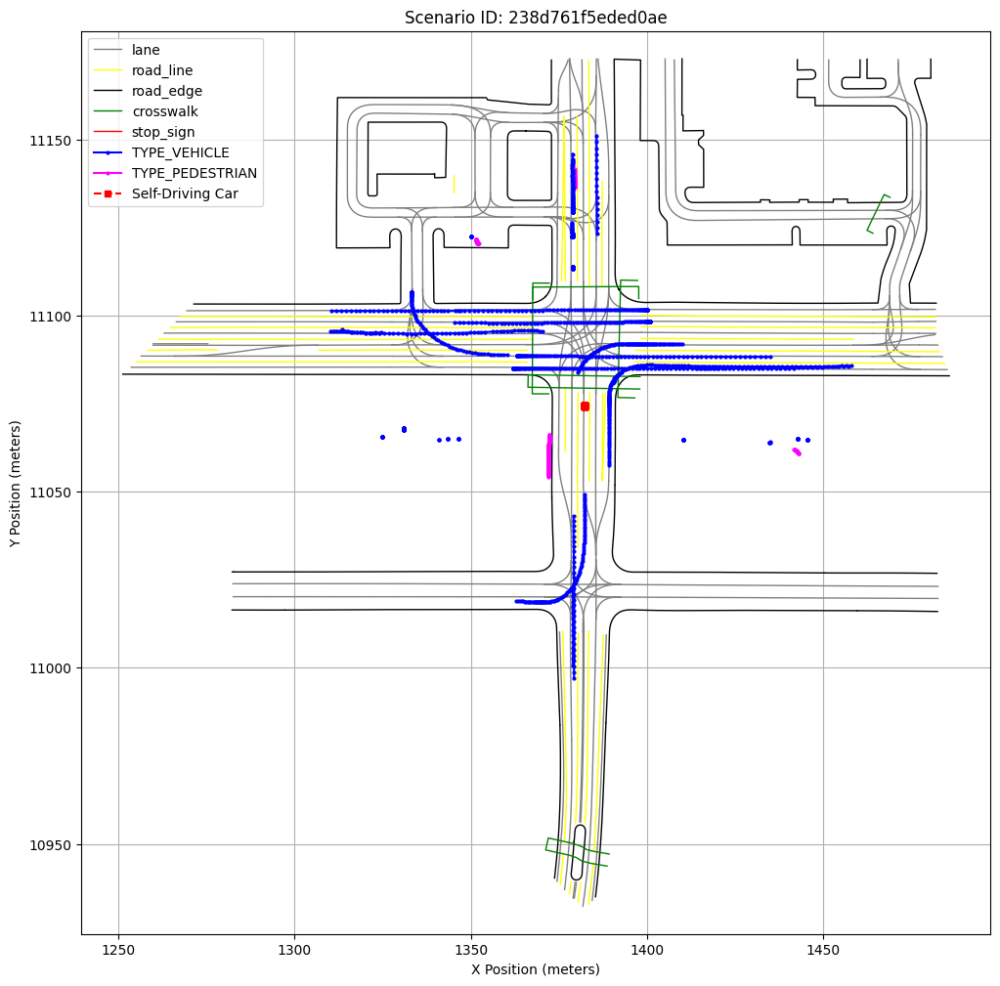

In [65]:
# Set up the plot
plt.figure(figsize=(12, 12))
plt.title(f"Scenario ID: {data['scenario_id']}")
plt.xlabel('X Position (meters)')
plt.ylabel('Y Position (meters)')

# Plot map features
feature_colors = {
    'lane': 'gray',
    'road_line': 'yellow',
    'road_edge': 'black',
    'stop_sign': 'red',
    'crosswalk': 'green',
    'speed_bump': 'orange'
}

def plot_map_features(feature_type):
    for feature in map_infos.get(feature_type, []):
        start_idx, end_idx = feature['polyline_index']
        polyline = polylines[start_idx:end_idx]
        plt.plot(polyline[:, 0], polyline[:, 1],
                 color=feature_colors.get(feature_type, 'blue'),
                 linewidth=1, label=feature_type if feature_type not in plt.gca().get_legend_handles_labels()[1] else "")

plot_map_features('lane')
plot_map_features('road_line')
plot_map_features('road_edge')
plot_map_features('crosswalk')
plot_map_features('stop_sign')
plot_map_features('speed_bump')

# Plot object trajectories
num_objects = trajs.shape[0]
object_type_colors = {
    'TYPE_VEHICLE': 'blue',
    'TYPE_PEDESTRIAN': 'magenta',
    'TYPE_CYCLIST': 'cyan',
    'TYPE_OTHER': 'brown'
}

for obj_idx in range(num_objects):
    object_id = object_ids[obj_idx]
    object_type = object_types[obj_idx]
    traj = trajs[obj_idx]
    valid = traj[:, 9].astype(bool)
    traj = traj[valid]

    plt.plot(traj[:, 0], traj[:, 1],
             marker='o',
             markersize=2,
             linestyle='-',
             color=object_type_colors.get(object_type, 'black'),
             label=object_type if object_type not in plt.gca().get_legend_handles_labels()[1] else "")

# Highlight the SDC
sdc_index = data['sdc_track_index']
sdc_traj = trajs[sdc_index]
valid = sdc_traj[:, 9].astype(bool)
sdc_traj = sdc_traj[valid]

plt.plot(sdc_traj[:, 0], sdc_traj[:, 1],
         marker='s',
         markersize=4,
         linestyle='--',
         color='red',
         label='Self-Driving Car')

# Finalize the plot
plt.legend()
plt.axis('equal')
plt.grid(True)
plt.show()